Data overview: Figure 1
----

Make all plots for Figure 1

- UMAP cell type annotation, cortex area, condition
- Distribution of counts
- Cell type annotation marker map

## Dependecy notebooks

TODO: define here links to other notebooks which need to be run in the correct order prior
to running this notebook (e.g. data preprocessing/data generation).
If there aren't any, remove this section.  
Also name your notebooks beginning with numbers: 01_quality_control.ipynb, 02_normalisation.ipynb, ...

## Import packages

If you want modules to be automatically reloaded when you call them, use `autoreload`:

In [11]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Import packages

In [12]:
# import standard packages
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import os
import sys
from pathlib import Path

# import single-cell packages
import scanpy as sc

# set verbosity levels
sc.settings.verbosity = 2

# ignore user warnings
import warnings
from scipy import stats
warnings.filterwarnings('ignore', category=UserWarning)

## Print package versions for reproducibility

If you want to exactly reproduce the results shown here, please make sure that your package versions match what is printed below. 

## Set up paths

Define global paths.

In [13]:
sys.path.insert(0, "../")  # this depends on the notebook depth and must be adapted per notebook

from paths import DATA_DIR, RESULTS_DIR, FIG_DIR
from colors import AREA_COLOR, CELL_TYPES_COLOR, CONDITION_COLOR
from utils.marker_genes import CANONICAL_MARKERS, old_canonical_marker, amyloid_plaque_human
from utils.canonical_marker_gex import plot_gene_expression_by_area, plot_marker_gene_expression_comparison
from utils.qc import simple_logit_boxplot

Set up the paths to save figures.

In [14]:
FIG_DIR = Path(FIG_DIR, 'data_overview')
sc.settings.figdir = str(FIG_DIR)
#scv.settings.figdir = str(FIG_DIR)
#cr.settings.figdir = str(FIG_DIR)

## Set global parameters

Set some plotting parameters.

In [15]:
plt.rcParams['figure.dpi'] = 90
plt.rcParams['savefig.dpi'] = 300 # If 'figure', uses the figure's dpi value.
SMALL_SIZE = 17
MEDIUM_SIZE = 19
BIGGER_SIZE = 21
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

If there are other global parameters for this analysis, put them here as well. 

## Define utility functions

Any utility functions you may need in this notebook go here. 

In [16]:
from utils.utils import SAMPLES, VERSION

In [17]:
from IPython.display import Markdown, display

def printmd(string):
    display(Markdown(string))

In [18]:
cell_type_dict = {
    "astro": "Astrocytes",
    "Micro": "Microglia",
    "OPC": "OPC",
    "Oligo": "Oligodendrocytes",
    "GlutaNeuron": "Excitatory neurons",
    "GABANeuron": "Inhibitory neurons",
    "Endo": "Endo",
    "VLMC": "VLMC"
}

## Load the data

In [13]:
adata = sc.read_h5ad(DATA_DIR / f"{VERSION}_adata_annotated_sea.h5ad")
adata

AnnData object with n_obs × n_vars = 29656 × 34859
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_co

In [14]:
adata = adata[adata.obs['cell_type_sea'] != 'unannotated']

In [11]:
print('Nr. cells: ', len(adata.obs_names))

Nr. cells:  26986


In [12]:
# filter out all genes that occur in less than 20 cells
adata = adata[:, (adata.layers['raw'] > 0.).sum(axis=0) > 20.].copy()
print('Nr. cells: ', len(adata.obs_names))

Nr. cells:  26986


Get embedding from integration methods.

In [13]:
adata_int = sc.read_h5ad(Path(DATA_DIR / f"{VERSION}_adata_sea_integrated_woNaN_donor.h5ad")) # _adata_sea_integrated_woNaN
print('Nr. cells: ', len(adata_int.obs_names), 'Nr. genes: ', len(adata_int.var_names))

Nr. cells:  26986 Nr. genes:  5000


In [14]:
adata_int = adata_int[adata_int.obs['cell_type_sea'] != 'unannotated']

In [15]:
assert len(adata.obs_names) == len(adata_int.obs_names), f"Nr. cells is not equal: {len(adata.obs_names)}, {len(adata_int.obs_names)}"

In [16]:
adata.obsm['X_scANVI'] = adata_int.obsm['X_scANVI']
adata.obsm['X_scVI'] = adata_int.obsm['X_scVI']

In [17]:
del adata_int

In [18]:
sc.pp.filter_genes(adata, min_cells=10) 
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=5000, batch_key = 'donor')

extracting highly variable genes
    finished (0:00:04)


In [19]:
#sc.tl.pca(adata, use_highly_variable = True)
sc.tl.pca(adata)
sc.pp.neighbors(adata, use_rep = 'X_scVI')
sc.tl.umap(adata)

computing PCA
    with n_comps=50
    finished (0:00:13)
computing neighbors
    finished (0:00:29)
computing UMAP
    finished (0:00:16)


In [20]:
adata.uns["cell_type_sea_colors"] = np.array(list(CELL_TYPES_COLOR.values()))

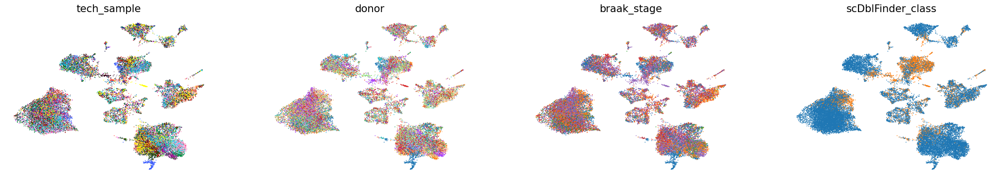

In [21]:
sc.pl.umap(adata, color=['tech_sample', 'donor', 'braak_stage', 'scDblFinder_class'], ncols=4, frameon = False, size =7, legend_loc = None)

**Interpretation**: OPC have high fraction of doublet cells. Are they co-expressing gene markers from other cell type clusters? OPCs are dividing faster and transitioning into other cell types, so should be that strict with the thresholing. 

We can still observe that some cells that cluster together are doublets or from one single donor. Lets remove them. 

In [22]:
sc.tl.leiden(adata, resolution=2.0, key_added = 'leiden_clean_up')

running Leiden clustering
    finished (0:00:24)


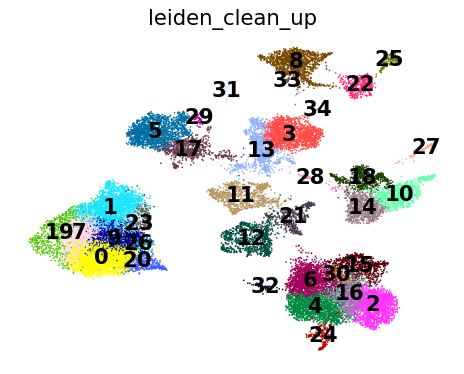

In [23]:
sc.pl.umap(adata, color=['leiden_clean_up'], ncols=2, frameon = False, size =7, legend_loc = 'on data')

In [24]:
#adata = adata[~ adata.obs['leiden_clean_up'].isin(['28', '29', '32', '33', '34'])] # for tech_sample
adata = adata[~ adata.obs['leiden_clean_up'].isin(['24', '32', '28', '33', '34'])]

In [25]:
print('Nr. cells: ', len(adata.obs_names), 'Nr. genes: ', len(adata.var_names))

Nr. cells:  26598 Nr. genes:  34802


In [26]:
adata.uns['cell_type_sea_colors'] = list(CELL_TYPES_COLOR.values())[:-1]

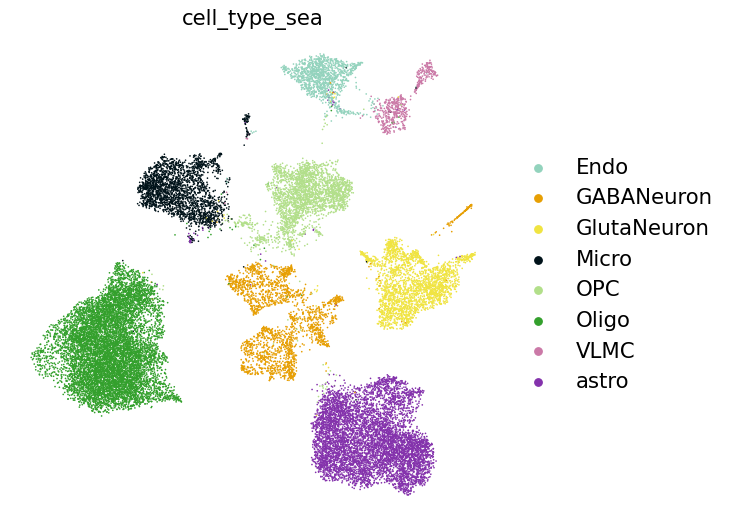

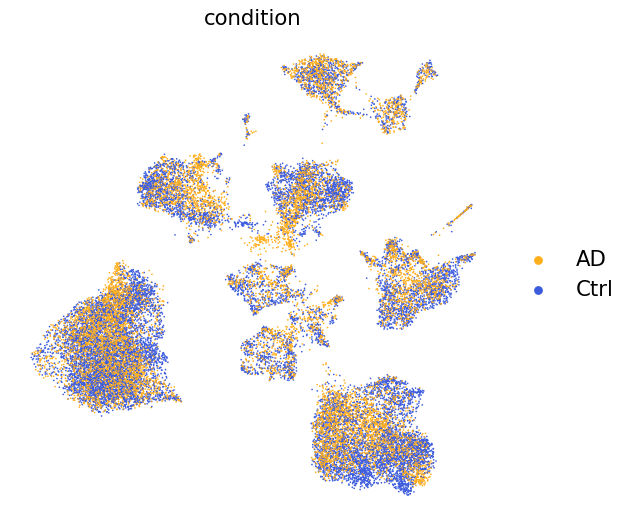

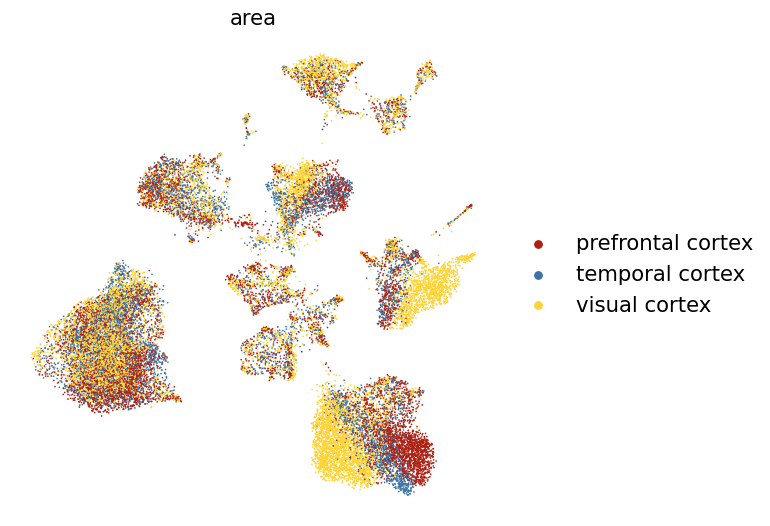

In [27]:
plt.rcParams['figure.figsize']= (7, 7)
for label, colors_dict in [('cell_type_sea', CELL_TYPES_COLOR) , ('condition', CONDITION_COLOR), ('area', AREA_COLOR)]:
    # del adata.uns[label + "_colors"]
    #adata.uns[label + "_colors"] = np.array(colors_dict.values())
    sc.pl.umap(adata, color=[label], ncols=2, frameon = False, size =7, save=f'_sea_umap_{label}.png')

Concerns:
- still high fraction of Ctrl6-GR (very different than other controls)

In [28]:
adata.write(Path(DATA_DIR / f"{VERSION}_adata_final.h5ad"))

## Statistics

In [19]:
adata = sc.read_h5ad(Path(DATA_DIR / f"{VERSION}_adata_final.h5ad"))
adata

AnnData object with n_obs × n_vars = 26598 × 34802
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea', 'leiden_clean_up'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by

In [23]:
adata.X = adata.layers['raw']

In [24]:
median_counts = np.median(adata.X.sum(axis=1))
median_features = np.median((adata.X > 0).sum(axis=1))

print(f"Median features per nucleus: {np.mean(median_features)}")
print(f"Median counts per nucleus: {np.mean(median_counts)}")

Median features per nucleus: 3086.552485149259
Median counts per nucleus: 10354.857421875


In [21]:
median_counts = np.median(adata[adata.obs['condition']=='AD'].X.sum(axis=1))
median_features = np.median((adata[adata.obs['condition']=='AD'].X > 0).sum(axis=1))

print("Only AD")
print(f"Median features per nucleus: {np.mean(median_features)}")
print(f"Median counts per nucleus: {np.mean(median_counts)}")

Only AD
Median features per nucleus: 2493.1285310734465
Median counts per nucleus: 7514.02734375


In [22]:
median_counts = np.median(adata[adata.obs['condition']=='Ctrl'].X.sum(axis=1))
median_features = np.median((adata[adata.obs['condition']=='Ctrl'].X > 0).sum(axis=1))

print("Only Ctrl")
print(f"Median features per nucleus: {np.mean(median_features)}")
print(f"Median counts per nucleus: {np.mean(median_counts)}")

Only Ctrl
Median features per nucleus: 3526.7821218074655
Median counts per nucleus: 12462.318359375


In [31]:
adata.obs['cell_type_sea'].value_counts(normalize=False)

cell_type_sea
Oligo          9030
astro          6420
OPC            2530
GlutaNeuron    2377
Micro          2262
GABANeuron     2221
Endo           1240
VLMC            518
Name: count, dtype: int64

In [46]:
adata.obs.cell_type_sea.value_counts(normalize=True)

cell_type_sea
Oligo          0.339499
astro          0.241372
OPC            0.095120
GlutaNeuron    0.089368
Micro          0.085044
GABANeuron     0.083503
Endo           0.046620
VLMC           0.019475
Name: proportion, dtype: float64

In [32]:
for area in np.unique(adata.obs['area']):
    sub_adata = adata[adata.obs['area'] == area]
    print(area, sub_adata.obs.groupby('condition')['cell_type_sea'].value_counts(normalize=True))

del sub_adata

prefrontal cortex condition  cell_type_sea
AD         Oligo            0.316332
           astro            0.273352
           Micro            0.110602
           GABANeuron       0.094556
           OPC              0.084527
           GlutaNeuron      0.061605
           Endo             0.038395
           VLMC             0.020630
Ctrl       Oligo            0.315048
           astro            0.299446
           OPC              0.106694
           GABANeuron       0.096880
           Micro            0.082285
           GlutaNeuron      0.056366
           Endo             0.030700
           VLMC             0.012582
Name: proportion, dtype: float64
temporal cortex condition  cell_type_sea
AD         Oligo            0.403137
           astro            0.162068
           OPC              0.110078
           Micro            0.109498
           GABANeuron       0.090619
           GlutaNeuron      0.059832
           Endo             0.041534
           VLMC             0.02

**Cortex areas**

In [14]:
print(adata.obs.area.value_counts(normalize=True))
print(adata.obs.area.value_counts(normalize=False))

area
visual cortex        0.430859
temporal cortex      0.288518
prefrontal cortex    0.280623
Name: proportion, dtype: float64
area
visual cortex        11460
temporal cortex       7674
prefrontal cortex     7464
Name: count, dtype: int64


**Age**

In [42]:
print(adata.obs.age.min(), adata.obs.age.max(), adata.obs.age.mean())

63 80 72.22870140612076


In [43]:
np.unique(adata.obs['APOE genotype'])

array(['APOE 3/3'], dtype=object)

In [44]:
donors_per_stage = (
    adata.obs[['braak_stage', 'donor']]
    .drop_duplicates()
    .groupby('braak_stage')
    .size()
)

print(donors_per_stage)

braak_stage
0    3
1    2
2    1
5    2
6    4
dtype: int64


In [13]:
print(adata.obs.condition.value_counts(normalize=True))
print(adata.obs.condition.value_counts(normalize=False))

condition
Ctrl    0.574103
AD      0.425897
Name: proportion, dtype: float64
condition
Ctrl    15270
AD      11328
Name: count, dtype: int64


In [48]:
df = adata.obs[['donor_v2', 'area']]
value_counts = pd.DataFrame(df.values, columns=df.columns).value_counts()
print(value_counts)

donor_v2  area             
Ctrl4     visual cortex        2579
AD6       visual cortex        1411
Ctrl1     visual cortex        1332
Ctrl2     visual cortex        1295
AD1       visual cortex        1106
AD2       prefrontal cortex    1056
Ctrl4     temporal cortex      1046
Ctrl2     temporal cortex      1029
Ctrl5     prefrontal cortex     966
AD6       prefrontal cortex     882
AD1       temporal cortex       869
AD7       prefrontal cortex     850
AD3       temporal cortex       831
Ctrl7     visual cortex         812
Ctrl4     prefrontal cortex     786
AD7       visual cortex         772
Ctrl3     visual cortex         732
Ctrl7     temporal cortex       719
Ctrl2     prefrontal cortex     689
AD2       temporal cortex       681
Ctrl7     prefrontal cortex     669
Ctrl5     temporal cortex       605
AD1       prefrontal cortex     575
AD2       visual cortex         543
Ctrl1     prefrontal cortex     501
Ctrl3     temporal cortex       498
AD7       temporal cortex       462


## Lineage markers

Show that each cell type is correctly annotated according to marker genes

In [30]:
CANONICAL_MARKERS_FINAL = {
    "astro":[
        'SLC1A2',
        'GFAP',
        'AQP4',
    ],
    "Endo":[
        'BSG',
        'CLDN5',
        'FLT1',
    ],
    "GlutaNeuron":[
        'GRIN2A',
        'CUX2',
        'SLC17A7',
        'SYT1',
    ],
    "GABANeuron":[
        'GAD2',
        'GAD1',
        'NXPH1'
    ],
    
    "Micro":[
        "APBB1IP",
        "C3",
        "P2RY12",
    ],
    "OPC":[
        'OLIG1',
        'PDGFRA',
        'VCAN',
        'SOX10'
    ],
    "Oligo":[
        'MOBP',
        'MBP',
        'PLP1',
    ],
     "VLMC":[
        'COL1A1',
        'COL1A2',
    ],
   
}

In [56]:
adata.obs['cell_type'] = adata.obs['cell_type_sea'].map(cell_type_dict)

In [31]:
CANONICAL_MARKERS_FINAL = {cell_type_dict.get(k, k): v for k, v in CANONICAL_MARKERS_FINAL.items()}

In [202]:
CANONICAL_MARKERS_FINAL

{'Astrocytes': ['SLC1A2', 'GFAP', 'AQP4'],
 'Endo': ['BSG', 'CLDN5', 'FLT1'],
 'Excitatory neurons': ['GRIN2A', 'CUX2', 'SLC17A7', 'SYT1'],
 'Inhibitory neurons': ['GAD2', 'GAD1', 'NXPH1'],
 'Microglia': ['APBB1IP', 'C3', 'P2RY12'],
 'OPC': ['OLIG1', 'PDGFRA', 'VCAN', 'SOX10'],
 'Oligodendrocytes': ['MOBP', 'MBP', 'PLP1'],
 'VLMC': ['COL1A1', 'COL1A2']}

In [57]:
adata.obs['cell_type'] = adata.obs['cell_type'].cat.reorder_categories(CANONICAL_MARKERS_FINAL.keys())

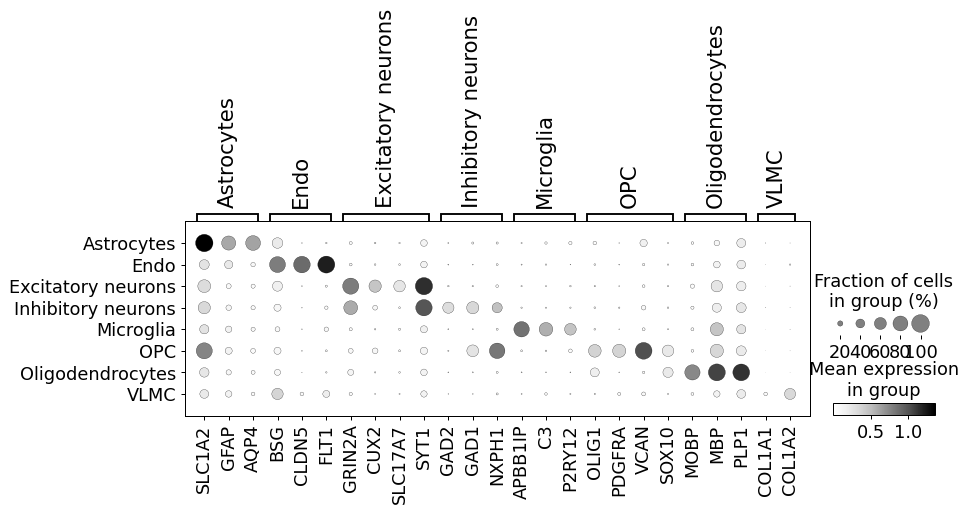

In [204]:
sc.pl.dotplot(adata, CANONICAL_MARKERS_FINAL, groupby='cell_type', cmap = 'Greys', log = True, save='marker_gene_dotplot.png')

Plot all canonical markers on the UMAP.

Astrocytes


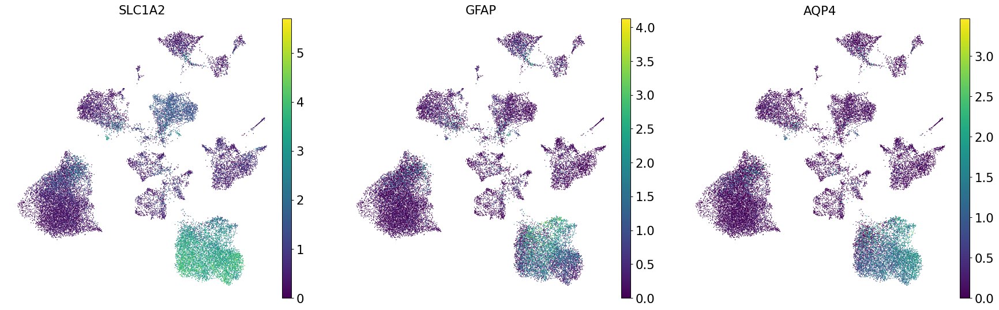

Endo


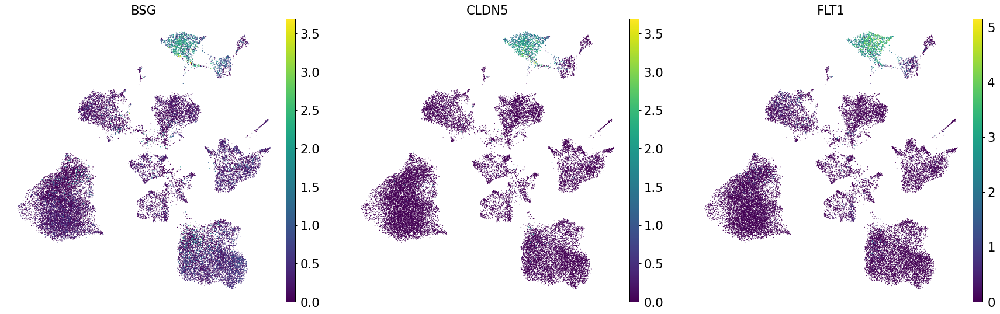

Excitatory neurons


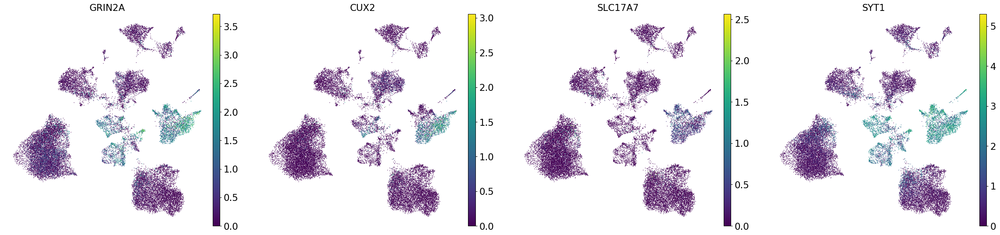

Inhibitory neurons


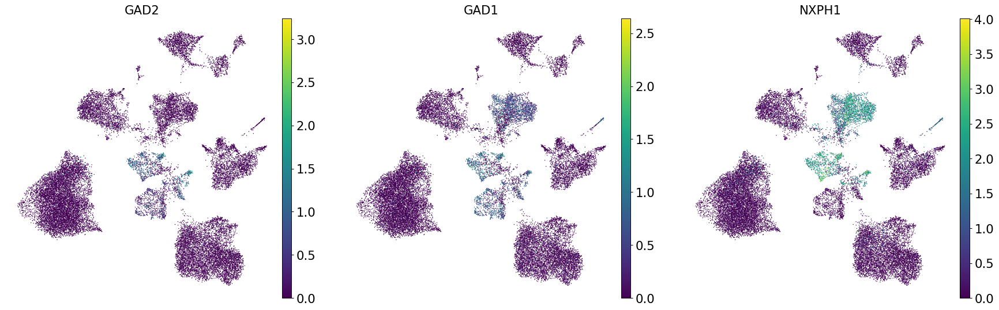

Microglia


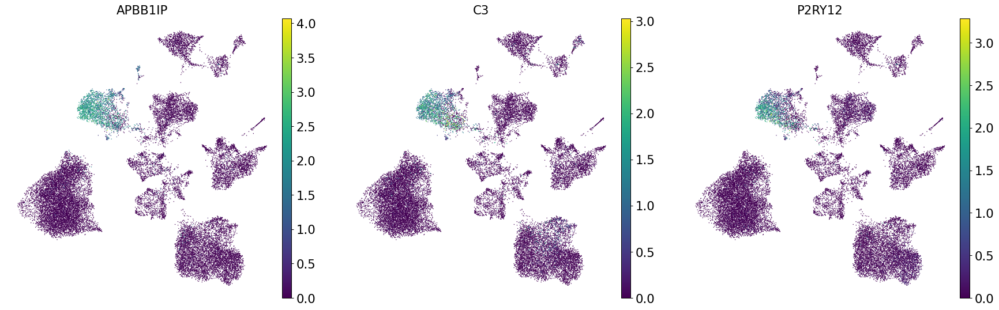

OPC


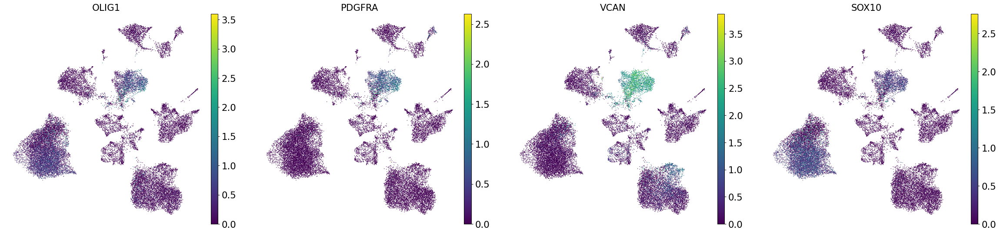

Oligodendrocytes


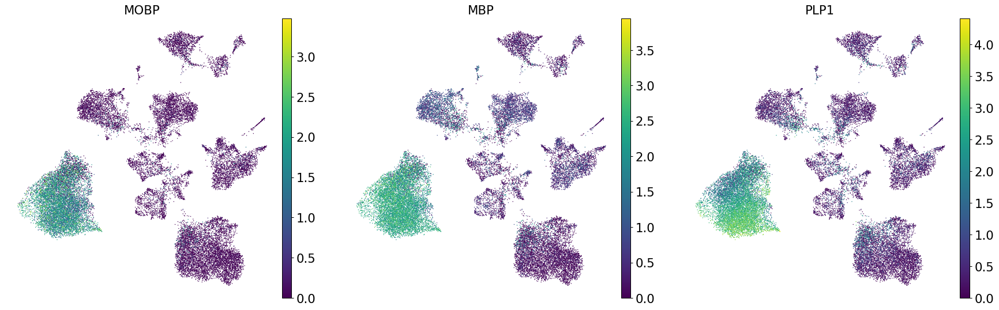

VLMC


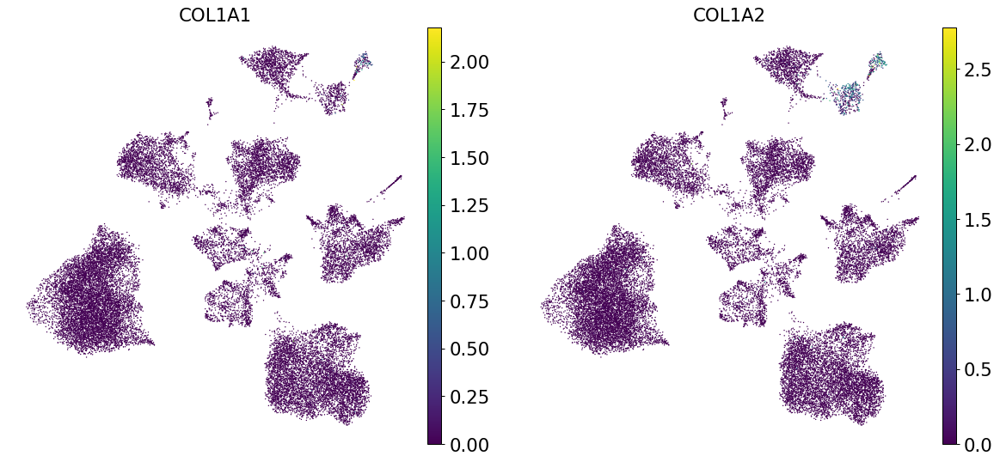

In [219]:
for cell_type, markers in CANONICAL_MARKERS_FINAL.items():
    print(cell_type)
    sc.pl.umap(adata, color=markers, ncols=len(markers), frameon=False, size=5, save=f'_markers_{cell_type}.png')

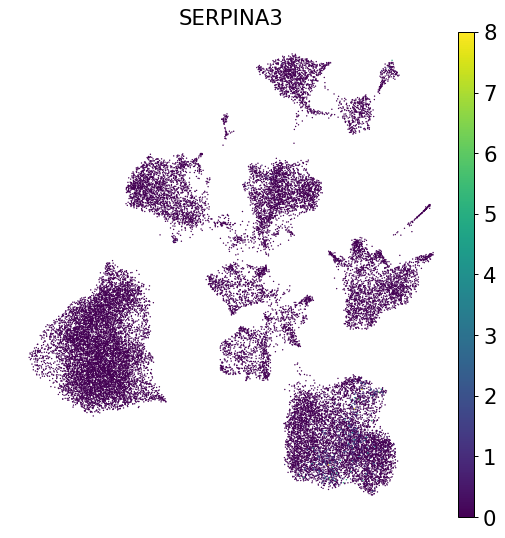

In [63]:
sc.pl.umap(adata, color=['SERPINA3'], ncols=3, frameon=False, size=5)

### Canonical marker gene expression differences

Are there difference in the expression values for the canonical gene markers?

Potential problem: Calculating mean -> What if the marker is expressed in less cells but then higher. Still will find it.

In [236]:
adata_original = adata.copy()

In [237]:
import pandas as pd

# Placeholder for calculated results organized by cell type
cell_type_tables = {}

adata = adata_original[adata_original.obs['area'] == 'temporal cortex']

# Loop through each cell type and its corresponding markers
for cell_type, markers in CANONICAL_MARKERS.items():
    # Filter adata for the selected cell type
    adata_ct = adata[adata.obs['cell_type_sea'] == cell_type]

    # Number of cells in each condition
    nr_cells_AD = len(adata_ct.obs_names[adata_ct.obs['condition'] == 'AD'])
    nr_cells_ctrl = len(adata_ct.obs_names[adata_ct.obs['condition'] == 'Ctrl'])
    
    # Calculate metrics for each marker
    mean_ctrl = adata_ct[adata_ct.obs['condition'] == 'Ctrl'].to_df()[markers].mean()
    mean_ad = adata_ct[adata_ct.obs['condition'] == 'AD'].to_df()[markers].mean()
    sum_ctrl = adata_ct[adata_ct.obs['condition'] == 'Ctrl'].to_df()[markers].sum() / nr_cells_ctrl
    sum_ad = adata_ct[adata_ct.obs['condition'] == 'AD'].to_df()[markers].sum() / nr_cells_AD
    median_ctrl = adata_ct[adata_ct.obs['condition'] == 'Ctrl'].to_df()[markers].median()
    median_ad = adata_ct[adata_ct.obs['condition'] == 'AD'].to_df()[markers].median()

    # Create a DataFrame for each cell type
    df_cell_type = pd.DataFrame({
        "Mean AD": mean_ad,
        "Mean Ctrl": mean_ctrl,
        "Sum/Nr AD": sum_ad,
        "Sum/Nr Ctrl": sum_ctrl,
        "Median AD": median_ad,
        "Median Ctrl": median_ctrl,
    })

    # Calculate differences
    df_cell_type["Mean Difference"] = df_cell_type["Mean AD"] - df_cell_type["Mean Ctrl"]
    df_cell_type["Sum/Nr Difference"] = df_cell_type["Sum/Nr AD"] - df_cell_type["Sum/Nr Ctrl"]
    df_cell_type["Median Difference"] = df_cell_type["Median AD"] - df_cell_type["Median Ctrl"]

    # Apply conditional formatting to highlight differences
    def color_high_low(val):
        color = 'green' if val > 0 else 'red'
        return f'background-color: {color}'
    
    styled_df = df_cell_type.style.applymap(color_high_low, subset=["Mean Difference", "Sum/Nr Difference", "Median Difference"])
    
    # Save the styled table in a dictionary for each cell type
    cell_type_tables[cell_type] = styled_df

In [238]:
# Display or return the tables for each cell type
for cell_type in ['OPC', 'Oligo']:
    cell_type_tables[cell_type].data.to_csv(f'/ictstr01/home/icb/francesca.drummer/jaekel/ad_jaekel/results/canonical_expr_{cell_type}_temporal.csv')
    cell_type_tables[cell_type]

In [244]:
cell_type_tables['OPC']

,Mean AD,Mean Ctrl,Sum/Nr AD,Sum/Nr Ctrl,Median AD,Median Ctrl,Mean Difference,Sum/Nr Difference,Median Difference
gene_symbol,,,,,,,,,
SOX10,0.297625,0.297250,0.297625,0.297250,0.000000,0.271595,0.000376,0.000376,-0.271595
OLIG2,0.369704,0.297738,0.369704,0.297738,0.000000,0.260231,0.071966,0.071966,-0.260231
OLIG1,0.725514,0.522924,0.725514,0.522924,0.617786,0.516014,0.202589,0.202589,0.101773
CSPG4,0.456861,0.325245,0.456861,0.325245,0.156876,0.293518,0.131616,0.131616,-0.136642
PDGFRA,0.375873,0.648821,0.375873,0.648821,0.000000,0.687031,-0.272948,-0.272948,-0.687031


In [245]:
adata_original.obs['cell_type']

AAACGAATCTAGCCTC-0                   Endo
AAACGCTGTGTTCAGT-0              Microglia
AAAGGTACACATACTG-0     Excitatory neurons
AAATGGAAGTCCCGAC-0              Microglia
AAATGGACACGGTGCT-0     Inhibitory neurons
                              ...        
TTTCCTCTCCCGTAAA-36            Astrocytes
TTTGACTGTCCACTCT-36    Inhibitory neurons
TTTGATCAGCCGGATA-36             Microglia
TTTGGTTTCTCTGCCA-36                  Endo
TTTGTTGTCCTGTACC-36                   OPC
Name: cell_type, Length: 26598, dtype: category
Categories (8, object): ['Astrocytes', 'Endo', 'Excitatory neurons', 'Inhibitory neurons', 'Microglia', 'OPC', 'Oligodendrocytes', 'VLMC']

In [246]:
adata_original.X = adata_original.layers['log1p_norm']

In [58]:
def plot_sample_mean_scatter(adata, canonical_markers, sample_col='sample', condition_col='condition', celltype_col='celltype', save_path=None):
    """
    Create scatter plots with regression lines showing mean gene expression per sample across conditions
    One subplot per cell type, calculating means only within cells of that cell type
    
    Parameters:
    -----------
    adata : AnnData object
        Your single-cell data object
    canonical_markers : dict
        Dictionary with cell type as keys and list of marker genes as values
    sample_col : str
        Column name in adata.obs containing sample information (default: 'sample')
    condition_col : str
        Column name in adata.obs containing condition information (default: 'condition')
    celltype_col : str
        Column name in adata.obs containing cell type information (default: 'celltype')
    save_path : str, optional
        Path to save the figure (e.g., 'scatter_plot.png')
        
    Returns:
    --------
    fig : matplotlib figure
    sample_means : DataFrame with mean expression per sample
    stats_df : DataFrame with correlation statistics for each cell type
    """
    
    # Set up the figure with subplots (no shared y-axis)
    n_celltypes = len(canonical_markers)
    fig, axes = plt.subplots(1, n_celltypes, figsize=(6*n_celltypes, 6))
    
    # If only one cell type, make axes a list for consistency
    if n_celltypes == 1:
        axes = [axes]
    
    # Define colors for conditions
    colors = ['#FFAE1C', '#3C5CDD']  
    
    # Initialize list to store statistics
    stats_list = []
    
    for idx, (celltype, genes) in enumerate(canonical_markers.items()):
        ax = axes[idx]
        
        # Filter genes that exist in the dataset
        available_genes = [gene for gene in genes if gene in adata.var_names]
        missing_genes = set(genes) - set(available_genes)
        
        if len(available_genes) == 0:
            ax.text(0.5, 0.5, f'No genes found\nfor {celltype}', 
                   ha='center', va='center', transform=ax.transAxes, fontsize=12)
            ax.set_title(f'{celltype}\n(No genes available)')
            stats_list.append({
                'Cell_Type': celltype,
                'Marker_Genes': '',
                'N_Genes': 0,
                'N_Samples': 0,
                'Pearson_r': np.nan,
                'Pearson_p': np.nan,
                'Spearman_r': np.nan,
                'Spearman_p': np.nan
            })
            continue
            
        if missing_genes:
            print(f"Warning: The following {celltype} genes are not in the dataset: {missing_genes}")
        
        # Filter cells to only include the current cell type
        celltype_mask = adata.obs[celltype_col] == celltype
        if celltype_mask.sum() == 0:
            ax.text(0.5, 0.5, f'No {celltype} cells found\nin dataset', 
                   ha='center', va='center', transform=ax.transAxes, fontsize=12)
            ax.set_title(f'{celltype}\n(No cells found)')
            stats_list.append({
                'Cell_Type': celltype,
                'Marker_Genes': ', '.join(genes),
                'N_Genes': len(available_genes),
                'N_Samples': 0,
                'Pearson_r': np.nan,
                'Pearson_p': np.nan,
                'Spearman_r': np.nan,
                'Spearman_p': np.nan
            })
            continue
            
        print(f"\n{celltype}: Found {celltype_mask.sum()} cells")
        
        # Extract expression data for available genes from cells of this cell type only
        celltype_adata = adata[celltype_mask, available_genes]
        log_exp_data = celltype_adata.X.toarray() if hasattr(celltype_adata.X, 'toarray') else celltype_adata.X
        
        gene_exp_df = pd.DataFrame(
            log_exp_data,
            columns=available_genes,
            index=celltype_adata.obs_names
        )
        
        # Add sample and condition information for cells of this cell type
        gene_exp_df[sample_col] = celltype_adata.obs[sample_col].values
        gene_exp_df[condition_col] = celltype_adata.obs[condition_col].values
        
        # Calculate mean expression per sample (across all marker genes for this cell type)
        sample_means = gene_exp_df.groupby([sample_col, condition_col])[available_genes].mean().mean(axis=1).reset_index()
        sample_means.columns = [sample_col, condition_col, 'Mean_Expression']
        
        # Convert condition to numeric for regression (control=0, AD=0.5)
        conditions = sample_means[condition_col].astype(str).unique()  # Convert to string first
        # Sort conditions to ensure consistent ordering (Control first, then AD)
        if 'control' in [c.lower() for c in conditions]:
            ctrl_condition = [c for c in conditions if 'control' in c.lower()][0]
            ad_condition = [c for c in conditions if 'control' not in c.lower()][0]
        elif 'ctrl' in [c.lower() for c in conditions]:
            ctrl_condition = [c for c in conditions if 'ctrl' in c.lower()][0]
            ad_condition = [c for c in conditions if 'ctrl' not in c.lower()][0]
        else:
            # If no obvious control/AD naming, use alphabetical order
            sorted_conditions = sorted(conditions)
            ctrl_condition = sorted_conditions[0]  
            ad_condition = sorted_conditions[1]
            
        condition_map = {ctrl_condition: 0, ad_condition: 0.5}  # Control on left (0), AD on right (0.5)
        sample_means['condition_numeric'] = sample_means[condition_col].astype(str).map(condition_map)
        
        # Reorder conditions for consistent display
        conditions = [ctrl_condition, ad_condition]
        
        # Create scatter plot with jitter
        # Add small random jitter to x-coordinates for better visualization
        np.random.seed(42)  # For reproducible jitter
        jitter_amount = 0.05
        x_jittered = sample_means['condition_numeric'] + np.random.normal(0, jitter_amount, len(sample_means))
        
        sns.scatterplot(
            x=x_jittered,
            y=sample_means['Mean_Expression'],
            hue=sample_means[condition_col],
            s=80,  # point size
            alpha=0.7,
            palette = colors,
            ax=ax
        )
        
        # Add regression line using the numeric values
        sns.regplot(
            x=sample_means['condition_numeric'],
            y=sample_means['Mean_Expression'],
            scatter=False,  # Don't plot points again
            ax=ax,
            color='black',
            line_kws={'linewidth': 2}
        )
        
        # Customize the subplot
        ax.set_title(f'{celltype} Markers\n(n={len(available_genes)} genes)', fontsize=14, fontweight='bold')
        ax.set_xlabel('Condition', fontsize=12, fontweight='bold')
        ax.set_ylabel('Mean Expression Level', fontsize=12, fontweight='bold')
        
        # Set x-axis ticks to show condition names (closer together)
        ax.set_xticks([0, 0.5])
        ax.set_xticklabels(conditions)
        ax.set_xlim(-0.25, 0.75)  # Adjust x-axis limits to center the closer points
        
        # Style improvements
        ax.tick_params(axis='both', which='major', labelsize=10, colors='black')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_linewidth(1.5)
        ax.spines['bottom'].set_linewidth(1.5)
        
        # Remove individual legends (keep only the last one)
        if idx < n_celltypes - 1:
            ax.get_legend().remove()
        else:
            # Style the legend
            legend = ax.legend(title='Condition', title_fontsize=13, fontsize=10, 
                             bbox_to_anchor=(1.05, 1), loc='upper left')
            legend.get_title().set_fontweight('bold')
        
        # Calculate and print correlation statistics
        from scipy.stats import pearsonr, spearmanr
        
        # Remove any NaN values before correlation calculation
        valid_data = sample_means.dropna(subset=['condition_numeric', 'Mean_Expression'])
        
        if len(valid_data) > 1 and valid_data['condition_numeric'].nunique() > 1:
            r_pearson, p_pearson = pearsonr(valid_data['condition_numeric'], valid_data['Mean_Expression'])
            r_spearman, p_spearman = spearmanr(valid_data['condition_numeric'], valid_data['Mean_Expression'])
        else:
            r_pearson = p_pearson = r_spearman = p_spearman = np.nan
            print(f"Warning: Cannot calculate correlation for {celltype} - insufficient variation in data")
        
        # Store statistics
        stats_list.append({
            'Cell_Type': celltype,
            'Marker_Genes': ', '.join(available_genes),
            'N_Genes': len(available_genes),
            'N_Samples': len(valid_data),
            'Pearson_r': r_pearson,
            'Pearson_p': p_pearson,
            'Spearman_r': r_spearman,
            'Spearman_p': p_spearman
        })
    
    # Create statistics DataFrame
    stats_df = pd.DataFrame(stats_list)
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    
    # Save figure if path provided
    if save_path:
        stats_df.to_csv(f'{save_path}.csv')
        plt.savefig(f'{save_path}.png', dpi=300, bbox_inches='tight')
        print(f"\nFigure saved as: {save_path}")
    
    plt.show()
    
    return fig, sample_means, stats_df

In [ ]:
plot_sample_mean_scatter(adata, CANONICAL_MARKERS_FINAL, celltype_col='cell_type', save_path = f'{FIG_DIR}/ad_vs_ctrl_markers_per_cell_type')


Astrocytes: Found 6420 cells

Endo: Found 1240 cells

Excitatory neurons: Found 2377 cells

Inhibitory neurons: Found 2221 cells

Microglia: Found 2262 cells

OPC: Found 2530 cells

Oligodendrocytes: Found 9030 cells


In [109]:
# Filter genes that exist in the dataset
genes = ['OLIG1', 'PDGFRA', 'VCAN', 'SOX10']
celltype = 'Oligo'

available_genes = [gene for gene in genes if gene in adata.var_names]
missing_genes = set(genes) - set(available_genes)

if len(available_genes) == 0:
    ax.text(0.5, 0.5, f'No genes found\nfor {celltype}', 
           ha='center', va='center', transform=ax.transAxes, fontsize=12)
    ax.set_title(f'{celltype}\n(No genes available)')
    
if missing_genes:
    print(f"Warning: The following {celltype} genes are not in the dataset: {missing_genes}")

# Filter cells to only include the current cell type
celltype_mask = adata.obs['cell_type'] == celltype
if celltype_mask.sum() == 0:
    ax.text(0.5, 0.5, f'No {celltype} cells found\nin dataset', 
           ha='center', va='center', transform=ax.transAxes, fontsize=12)
    ax.set_title(f'{celltype}\n(No cells found)')
    
print(f"\n{celltype}: Found {celltype_mask.sum()} cells")

# Extract expression data for available genes from cells of this cell type only
celltype_adata = adata[celltype_mask, available_genes]
log_exp_data = celltype_adata.X.toarray() if hasattr(celltype_adata.X, 'toarray') else celltype_adata.X


Oligo: Found 9030 cells


Perform statistical test. Select from: t-test_ind, t-test_welch, t-test_paired, Mann-Whitney, Mann-Whitney-gt, Mann-Whitney-ls, Levene, Wilcoxon, Kruskal, Brunner-Munzel

In [249]:
from statannotations.Annotator import Annotator
import seaborn as sns
import matplotlib.pyplot as plt

CELL_TYPE = 'Oligo'

for area in ['prefrontal', 'temporal', 'visual']:
    adata = adata_original[adata_original.obs['area'] == f'{area} cortex']

    adata_ct = adata[adata.obs['cell_type_sea'] == CELL_TYPE]
    CANONICAL_MARKER = "SOX10"
    
    # Extract values
    SOX10 = adata_ct[:, CANONICAL_MARKER].X.toarray().flatten() if not isinstance(adata_ct[:, CANONICAL_MARKER].X, np.ndarray) else adata_ct[:, CANONICAL_MARKER].X.flatten
    condition = adata_ct.obs["condition"]
    
    
    # Create dataframe
    df = pd.DataFrame({
        CANONICAL_MARKER: SOX10,
        "condition": condition,
    })
    
    fig, axs = plt.subplots(1, 2, figsize=(20, 6))
    sns.violinplot(data=df, x="condition", y=CANONICAL_MARKER, ax = axs[0])
    plt.show()
    
    x = "condition"
    y_list = [CANONICAL_MARKER]
    # Define order for consistent display
    #order = sorted(df[x].unique())
    
    # Define comparisons between groups
    pairs = [
        ("AD", "Ctrl"),
    ]
    
    for y in y_list:
        plt.figure(figsize=(6, 5))
        ax = sns.boxplot(data=df, x=x, y=y)
        
        # Add statistical annotation
        annot = Annotator(
            ax,
            pairs=pairs,
            data=df,
            x=x,
            y=y
        )
        annot.configure(
            test="Mann-Whitney", #t-test_ind
            loc="inside",  # Use "outside" if space is tight
            text_format="star",
            show_test_name=False,
            verbose=1,
            comparisons_correction="bonferroni",  # Or None if no multiple testing correction
            fontsize=10
        )
        annot.apply_test()
        annot.annotate()
        
        # Final layout and save
        fig.tight_layout()
        plt.savefig(f"{FIG_DIR}/MWW_test_{CANONICAL_MARKER}.png")

ModuleNotFoundError: No module named 'statannotations'

## MT fraction vs MALAT1

Are there differences across MT fraction across cell types?

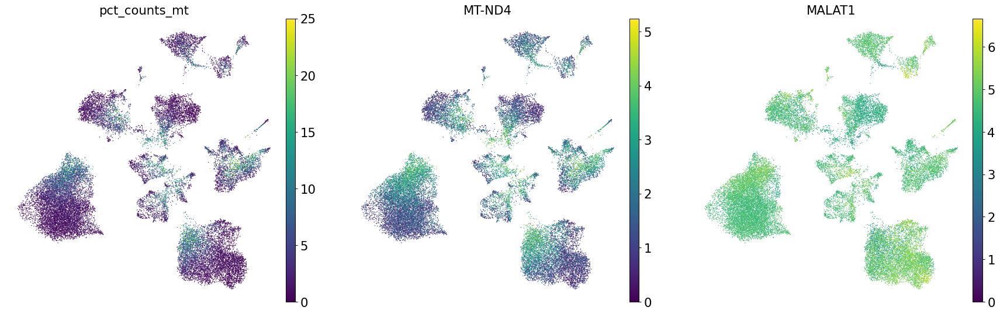

In [229]:
sc.pl.umap(adata, color=['pct_counts_mt', 'MT-ND4', 'MALAT1'], ncols=3, frameon=False, size=5)

In [12]:
adata

AnnData object with n_obs × n_vars = 26598 × 34802
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea', 'leiden_clean_up'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by

In [10]:
adata.X = adata.layers['log1p_norm']

prefrontal cortex
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

AD vs. Ctrl: Mann-Whitney-Wilcoxon test two-sided, P_val:6.602e-08 U_stat=6.433e+06
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

AD vs. Ctrl: Mann-Whitney-Wilcoxon test two-sided, P_val:2.552e-91 U_stat=8.817e+06
temporal cortex
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

AD vs. Ctrl: Mann-Whitney-Wilcoxon test two-sided, P_val:1.588e-104 U_stat=5.188e+06
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     

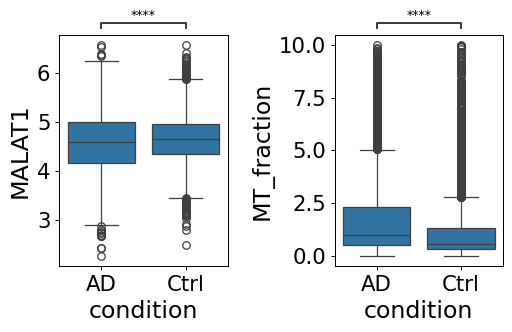

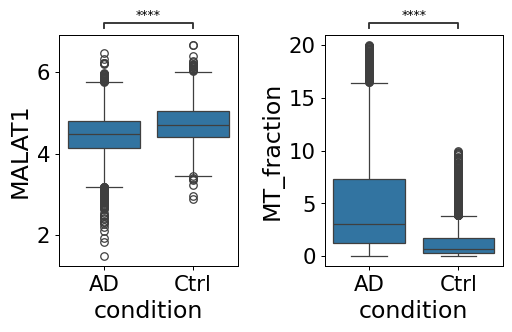

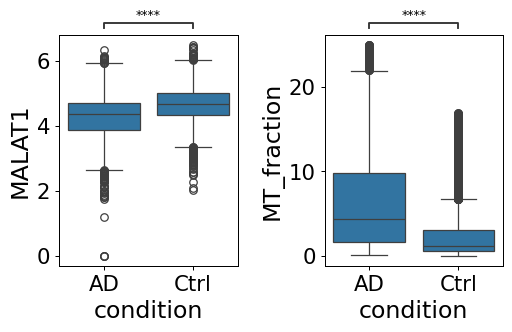

In [14]:
from utils.qc import statistical_test_boxplot

for cell_type in np.unique(adata.obs['area']):
    print(cell_type)
    sub_adata = adata[adata.obs['area'] == cell_type]
    # Extract values
    malat1 = sub_adata[:, "MALAT1"].X.toarray().flatten() if not isinstance(sub_adata[:, "MALAT1"].X, np.ndarray) else sub_adata[:, "MALAT1"].X.flatten
    mt_frac = sub_adata.obs["pct_counts_mt"]
    sample = sub_adata.obs["condition_area"]
    condition = sub_adata.obs["condition"]
    area = sub_adata.obs["area_abbrev"]
    log_counts = sub_adata.obs["log_counts"]
    
    
    # Create dataframe
    df = pd.DataFrame({
        "MALAT1": malat1,
        "MT_fraction": mt_frac,
        "sample": sample,
        "condition": condition,
        "area": area,
        "log_counts": log_counts
    })
    x = "condition"
    features = ["MALAT1", "MT_fraction"]
    # Define order for consistent display
    order = sorted(df[x].unique())
    
    # Define comparisons between groups
    pairs = [
        ("AD", "Ctrl")
    ]
    
    statistical_test_boxplot(df, x, features, pairs)

- high-pctMT > 0.15
- low-pctMT <= 0.15

In [15]:
adata.obs['mt_cat'] = adata.obs['pct_counts_mt'].apply(lambda x: 'High MT' if x > 0.15 else 'Low MT')

In [50]:
from scipy.stats import pearsonr, spearmanr

# Set up plotting parameters
plt.rcParams['figure.figsize'] = (10, 6)
sns.set_style("whitegrid")

def calculate_correlations(adata, covariate = 'braak_stage'):
    """
    Calculate correlations between pct_mt_counts and Braak_stage
    both across all areas and within each area
    """
    results = {}
    
    # Overall correlation (across all areas)
    overall_pearson_r, overall_pearson_p = pearsonr(
        adata.obs['pct_counts_mt'], 
        adata.obs[covariate]
    )
    overall_spearman_r, overall_spearman_p = spearmanr(
        adata.obs['pct_counts_mt'], 
        adata.obs[covariate]
    )
    
    results['overall'] = {
        'pearson_r': overall_pearson_r,
        'pearson_p': overall_pearson_p,
        'spearman_r': overall_spearman_r,
        'spearman_p': overall_spearman_p,
        'n_cells': len(adata.obs)
    }
    
    # Area-specific correlations
    for area in np.unique(adata.obs['area']):
        sub_adata = adata[adata.obs['area'] == area]
        
        if len(sub_adata.obs) > 3:  # Need at least 4 points for meaningful correlation
            pearson_r, pearson_p = pearsonr(
                sub_adata.obs['pct_counts_mt'], 
                sub_adata.obs[covariate]
            )
            spearman_r, spearman_p = spearmanr(
                sub_adata.obs['pct_counts_mt'], 
                sub_adata.obs[covariate]
            )
            
            results[area] = {
                'pearson_r': pearson_r,
                'pearson_p': pearson_p,
                'spearman_r': spearman_r,
                'spearman_p': spearman_p,
                'n_cells': len(sub_adata.obs)
            }
        else:
            results[area] = {
                'pearson_r': np.nan,
                'pearson_p': np.nan,
                'spearman_r': np.nan,
                'spearman_p': np.nan,
                'n_cells': len(sub_adata.obs)
            }
    
    return results

def print_correlation_results(results):
    """Print correlation results in a formatted way"""
    print("=" * 60)
    print("CORRELATION ANALYSIS: pct_mt_counts vs Braak_stage")
    print("=" * 60)
    
    # Overall results
    print("\nOVERALL (across all areas):")
    print(f"  Pearson r = {results['overall']['pearson_r']:.4f}, p = {results['overall']['pearson_p']:.4e}")
    print(f"  Spearman r = {results['overall']['spearman_r']:.4f}, p = {results['overall']['spearman_p']:.4e}")
    print(f"  N cells = {results['overall']['n_cells']:,}")
    
    # Area-specific results
    print("\nAREA-SPECIFIC:")
    for area, stats in results.items():
        if area != 'overall':
            print(f"\n  {area}:")
            if not np.isnan(stats['pearson_r']):
                print(f"    Pearson r = {stats['pearson_r']:.4f}, p = {stats['pearson_p']:.4e}")
                print(f"    Spearman r = {stats['spearman_r']:.4f}, p = {stats['spearman_p']:.4e}")
            else:
                print(f"    Insufficient data for correlation")
            print(f"    N cells = {stats['n_cells']:,}")


def create_summary_table(results):
    """Create a summary DataFrame of correlation results"""
    summary_data = []
    
    for area, stats in results.items():
        summary_data.append({
            'Area': area,
            'N_cells': stats['n_cells'],
            'Pearson_r': stats['pearson_r'],
            'Pearson_p': stats['pearson_p'],
            'Spearman_r': stats['spearman_r'],
            'Spearman_p': stats['spearman_p']
        })
    
    summary_df = pd.DataFrame(summary_data)
    
    # Reorder so 'overall' comes first
    if 'overall' in summary_df['Area'].values:
        overall_row = summary_df[summary_df['Area'] == 'overall']
        other_rows = summary_df[summary_df['Area'] != 'overall'].sort_values('Area')
        summary_df = pd.concat([overall_row, other_rows], ignore_index=True)
    
    return summary_df

# Run the analysis
print("Running correlation analysis...")
results = calculate_correlations(adata)

# Print results
print_correlation_results(results)

# Create summary table
summary_df = create_summary_table(results)
print("\n" + "="*60)
print("SUMMARY TABLE:")
print("="*60)
print(summary_df.round(4))


Running correlation analysis...
CORRELATION ANALYSIS: pct_mt_counts vs Braak_stage

OVERALL (across all areas):
  Pearson r = 0.3388, p = 0.0000e+00
  Spearman r = 0.3439, p = 0.0000e+00
  N cells = 26,598

AREA-SPECIFIC:

  prefrontal cortex:
    Pearson r = 0.1474, p = 1.5938e-37
    Spearman r = 0.2025, p = 6.0646e-70
    N cells = 7,464

  temporal cortex:
    Pearson r = 0.4478, p = 0.0000e+00
    Spearman r = 0.4377, p = 0.0000e+00
    N cells = 7,674

  visual cortex:
    Pearson r = 0.4280, p = 0.0000e+00
    Spearman r = 0.4806, p = 0.0000e+00
    N cells = 11,460

SUMMARY TABLE:
                Area  N_cells  Pearson_r  Pearson_p  Spearman_r  Spearman_p
0            overall    26598     0.3388        0.0      0.3439         0.0
1  prefrontal cortex     7464     0.1474        0.0      0.2025         0.0
2    temporal cortex     7674     0.4478        0.0      0.4377         0.0
3      visual cortex    11460     0.4280        0.0      0.4806         0.0


Prepare adata object as pandas dataframe. 

In [68]:
data = adata.obs[['braak_stage', 'pct_counts_mt', 'area']]
data.head()

,braak_stage,pct_counts_mt,area
AAACGAATCTAGCCTC-0,5,1.670175,temporal cortex
AAACGCTGTGTTCAGT-0,5,10.253998,temporal cortex
AAAGGTACACATACTG-0,5,19.918034,temporal cortex
AAATGGAAGTCCCGAC-0,5,0.691937,temporal cortex
AAATGGACACGGTGCT-0,5,7.377049,temporal cortex


In [69]:
keys = ['prefrontal cortex', 'temporal cortex', 'visual cortex']
colors = [AREA_COLOR[key] for key in keys]

Plot saved to: /ictstr01/home/icb/francesca.drummer/jaekel/ad_jaekel/figures/data_overview/scattered_boxplot_mito_braak_per_area.png

Sample counts by group and area:
area         prefrontal cortex  temporal cortex  visual cortex  All
braak_stage                                                        
0                            3                3              3    9
1                            2                2              2    6
2                            1                1              1    3
5                            2                2              2    6
6                            3                4              4   11
All                         11               12             12   35


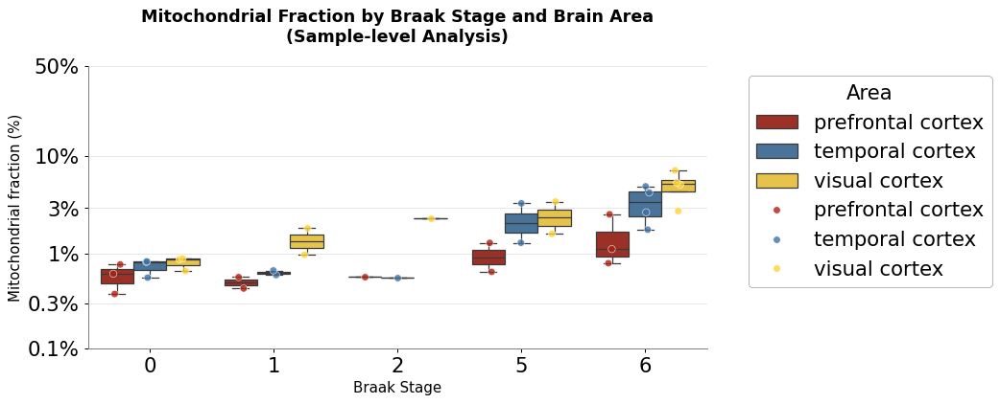

In [67]:
fig, ax, data = simple_logit_boxplot(adata, sample_col='sample', colors=AREA_COLOR, save_path = Path(FIG_DIR, 'scattered_boxplot_mito_braak_per_area.png'))
plt.show()

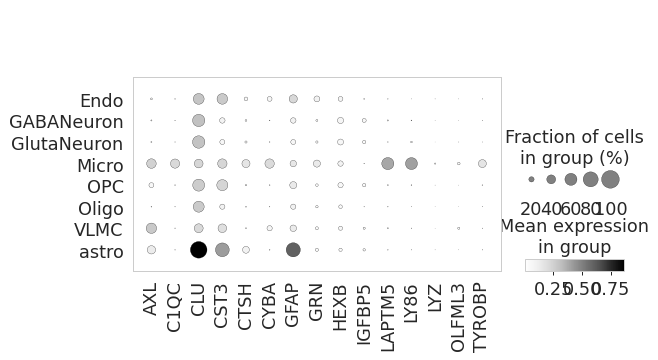

In [51]:
sc.pl.dotplot(adata, amyloid_plaque_human, groupby='cell_type_sea', cmap = 'Greys', log = True, save='amyloid_plaque_dotplot_cell_type.png')

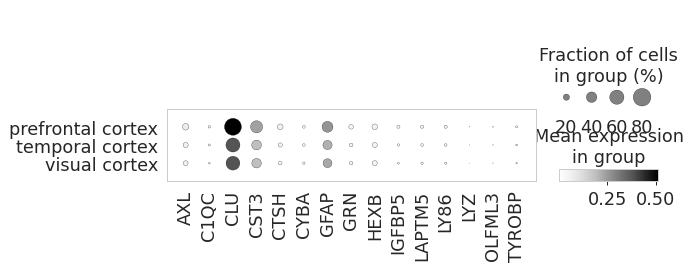

In [52]:
sc.pl.dotplot(adata, amyloid_plaque_human, groupby='area', cmap = 'Greys', log = True, save='amyloid_plaque_dotplot_area.png')

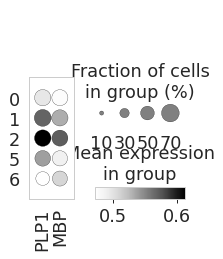

In [55]:
sc.pl.dotplot(adata, ['PLP1', 'MBP'], groupby='braak_stage', cmap = 'Greys', log = True, save='amyloid_plaque_dotplot_area.png')

## Oligo subcluster

In [251]:
adata = sc.read_h5ad(Path(DATA_DIR / f"{VERSION}_adata_final.h5ad"))
adata

AnnData object with n_obs × n_vars = 26791 × 34802
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea', 'leiden_clean_up'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by

In [61]:
adata_oligo = adata[adata.obs['cell_type_sea'] == 'Oligo']
adata_oligo

View of AnnData object with n_obs × n_vars = 9030 × 34802
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea', 'leiden_clean_up'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dro

In [62]:
adata_oligo.write(Path(DATA_DIR / f"{VERSION}_adata_oligo_subset.h5ad"))

## OPC subcluster

In [10]:
adata = sc.read_h5ad(Path(DATA_DIR / f"{VERSION}_adata_final.h5ad"))
adata

AnnData object with n_obs × n_vars = 26598 × 34802
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea', 'leiden_clean_up'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by

In [11]:
adata_opc = adata[adata.obs['cell_type_sea'] == 'OPC'].copy()
adata_opc

AnnData object with n_obs × n_vars = 2530 × 34802
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea', 'leiden_clean_up'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_

In [14]:
# adata_opc.X = adata_opc.layers['log1p_norm']
# sc.pp.neighbors(adata_opc)
# sc.tl.leiden(adata_opc, resolution=0.5)
# sc.tl.umap(adata_opc)
# sc.pl.umap(
#     adata_opc, 
#     color=['leiden', 'log_counts', 'n_genes', 'mt_fraction', 'tech_sample', 'condition', 'area'], 
#     ncols=2, 
#     frameon=False
# )

In [13]:
adata_opc.write(Path(DATA_DIR / f"{VERSION}_adata_OPC_subset.h5ad"))

## Cell type heatmap visualization

Show the distribution of cells in the clusters. Can we the same trend for other cell types? 

In [9]:
adata = sc.read_h5ad(Path(DATA_DIR / f"{VERSION}_adata_final.h5ad"))
adata

AnnData object with n_obs × n_vars = 26598 × 34802
    obs: 'sample', 'condition', 'area', 'age', 'donor', 'sequencing batch', 'sequencing id', 'sex', 'APOE genotype', 'brain area number', 'running number', 'donor_v2', 'donor_v2_area', 'n_counts', 'log_counts', 'n_genes', 'tech_sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_nuclear', 'log1p_total_counts_nuclear', 'pct_counts_nuclear', 'braak_stage', 'area_abbrev', 'condition_area', 'brainbank', 'brain_area_latin', 'soupx_groups', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'mt_groups', 'tech_sample_2', 'log1p_counts', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_2.0', 'celltype', 'cell_type', 'cell_type_sea', 'leiden_clean_up'
    var: 'ensemble_id', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'ribo', 'hb', 'nuclear', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by

Endo
computing density on 'umap'
computing density on 'umap'
computing density on 'umap'


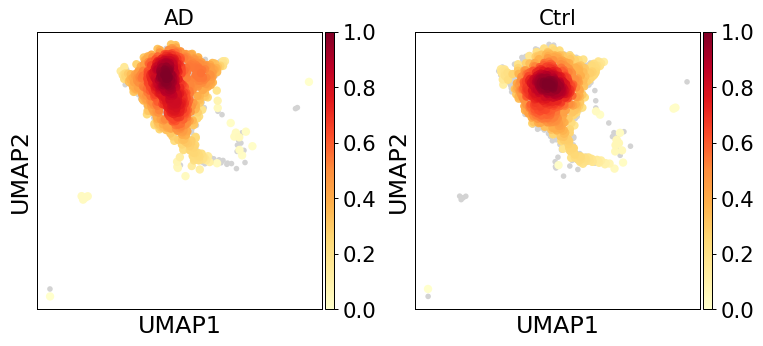

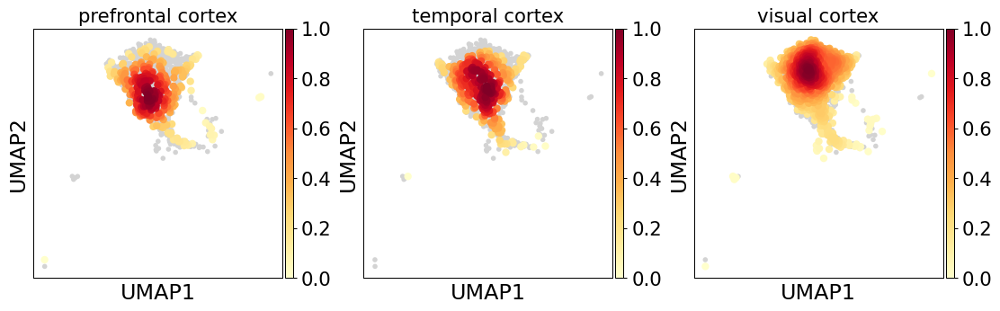

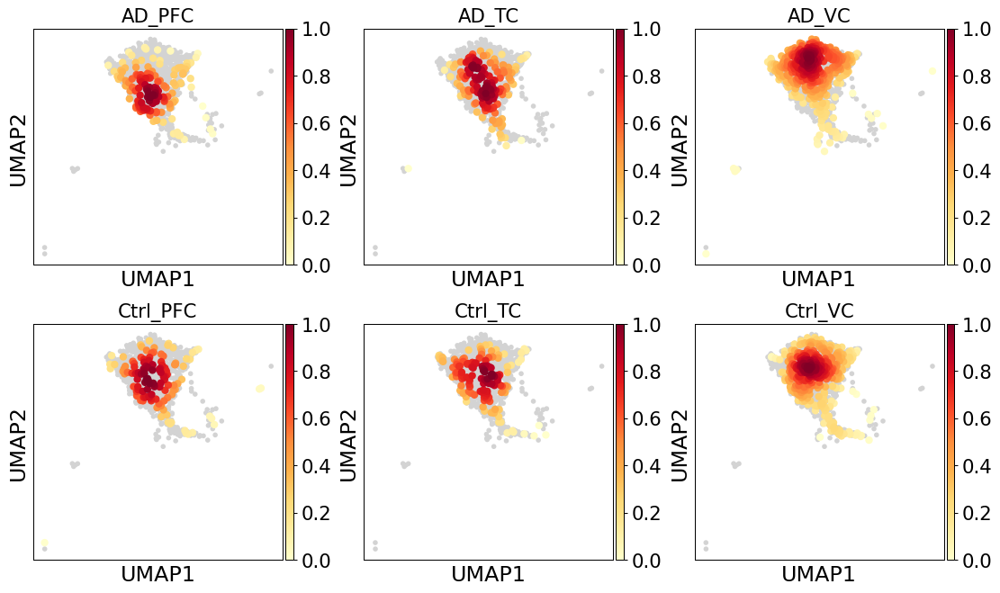

GABANeuron
computing density on 'umap'
computing density on 'umap'
computing density on 'umap'


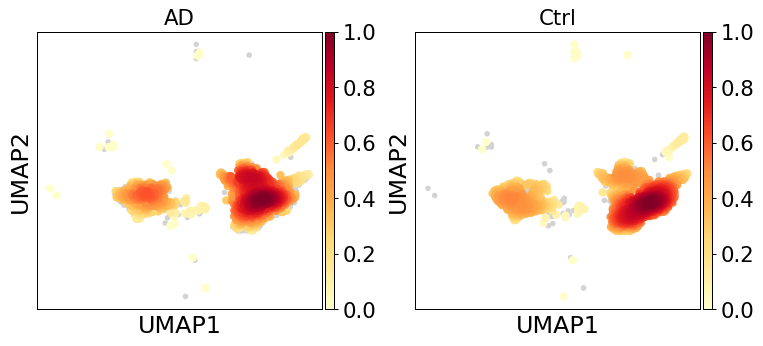

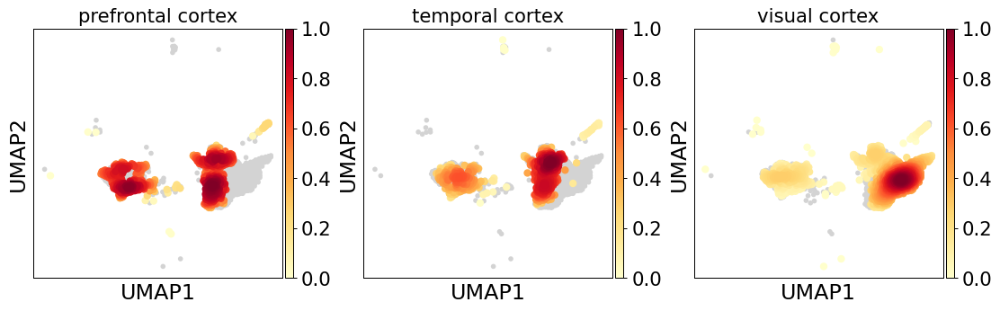

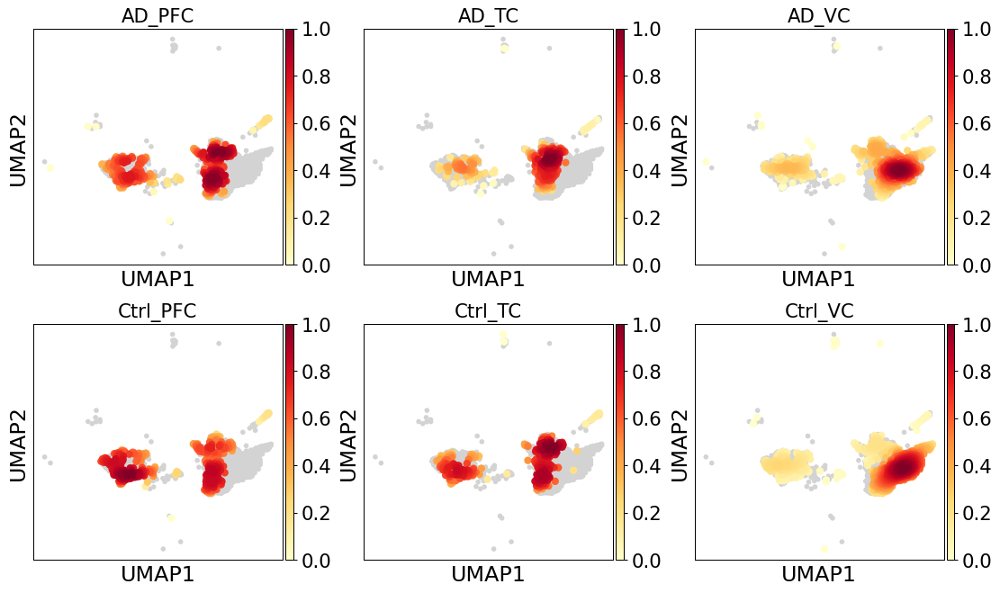

GlutaNeuron
computing density on 'umap'
computing density on 'umap'
computing density on 'umap'


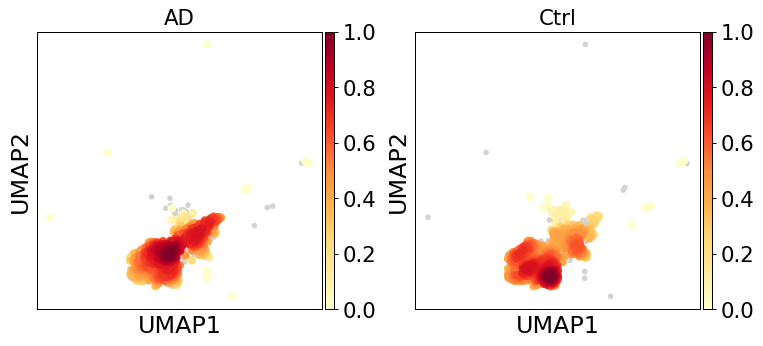

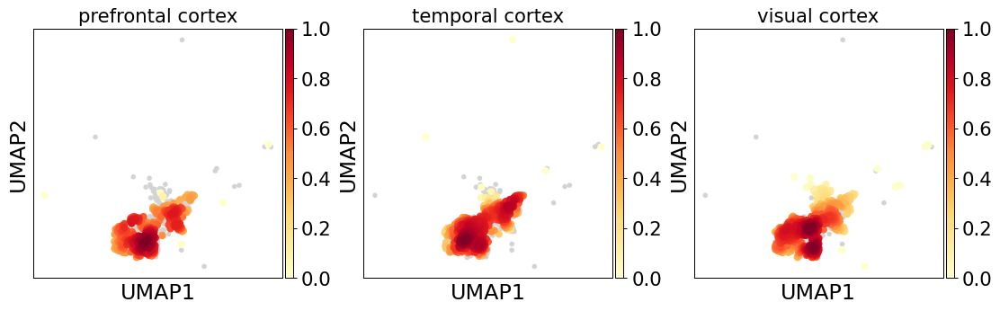

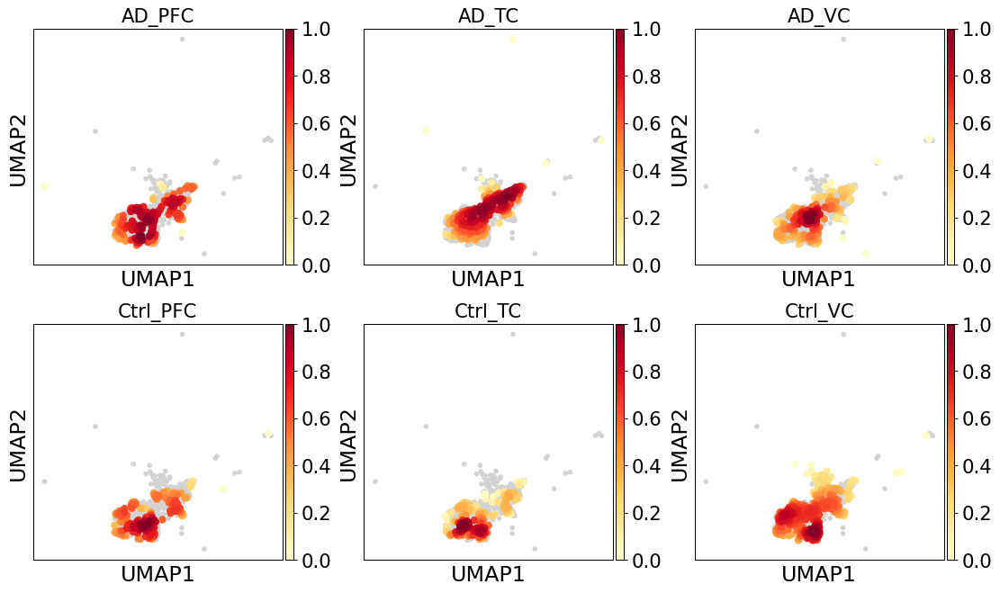

Micro
computing density on 'umap'
computing density on 'umap'
computing density on 'umap'


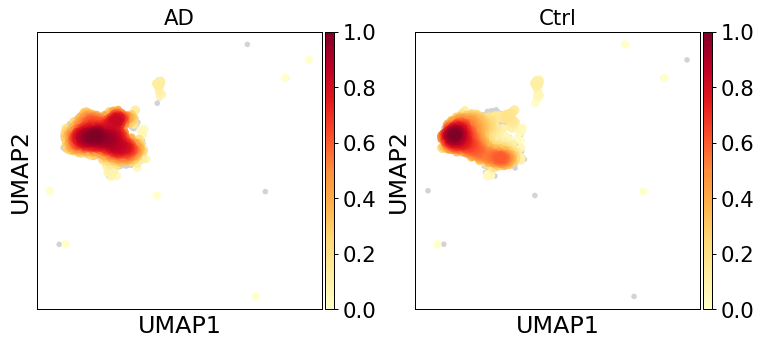

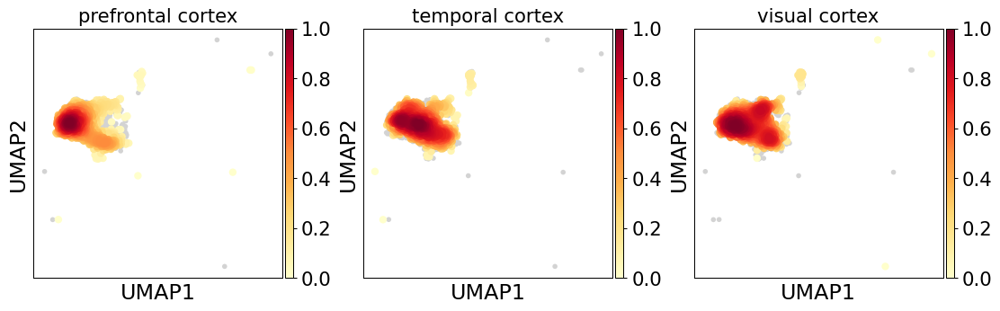

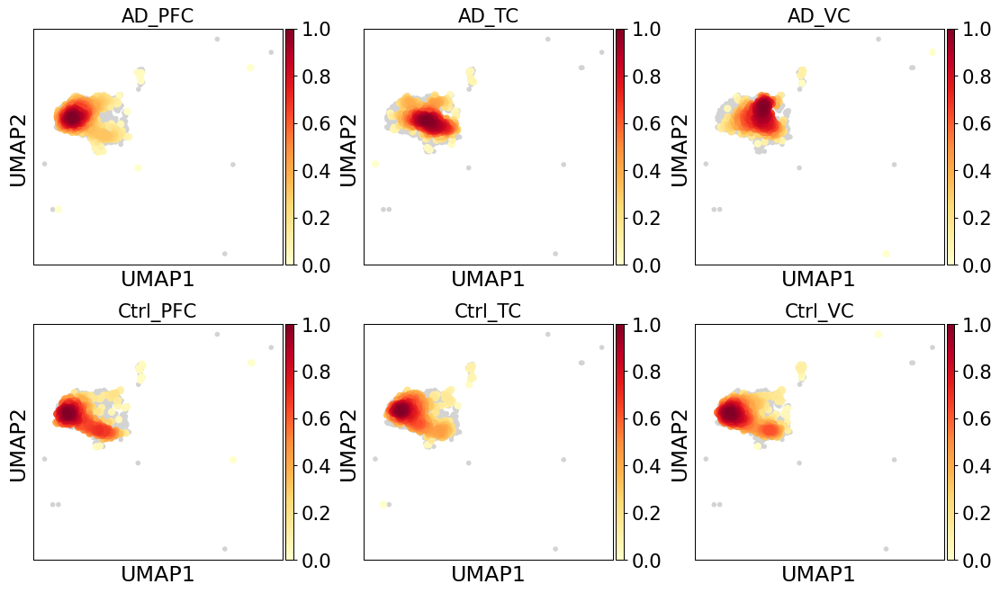

OPC
computing density on 'umap'
computing density on 'umap'
computing density on 'umap'


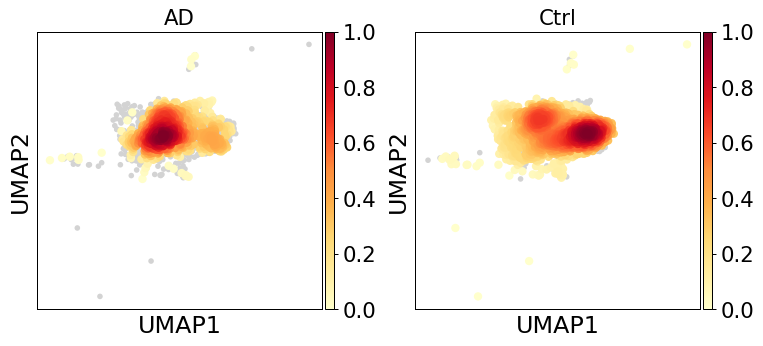

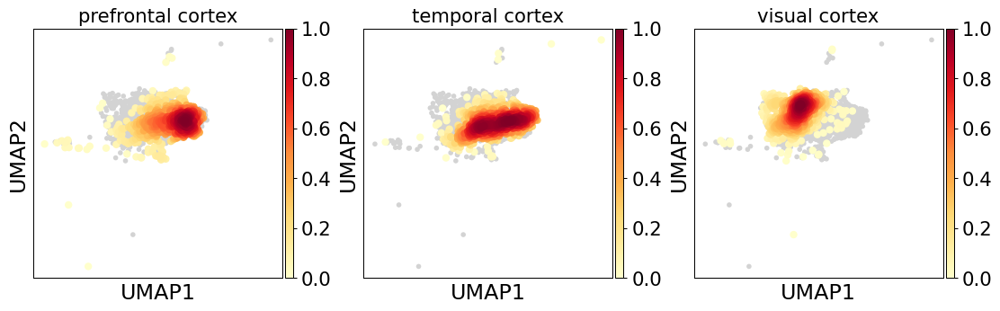

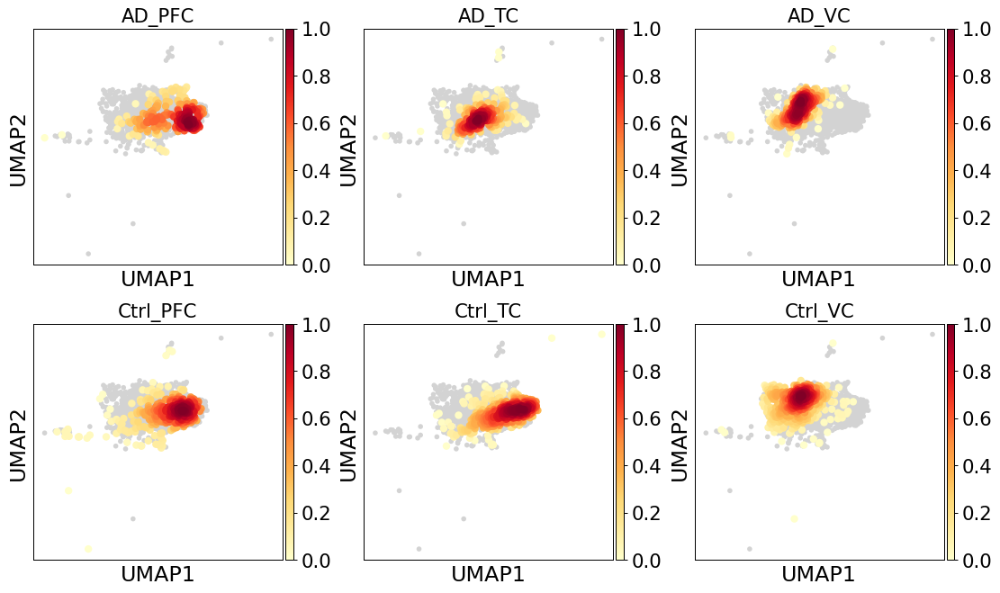

Oligo
computing density on 'umap'
computing density on 'umap'
computing density on 'umap'


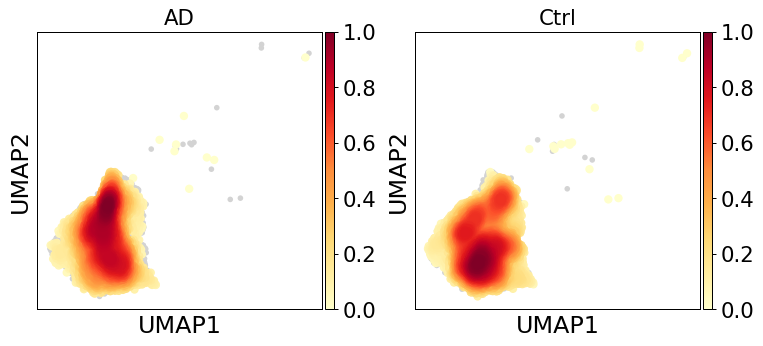

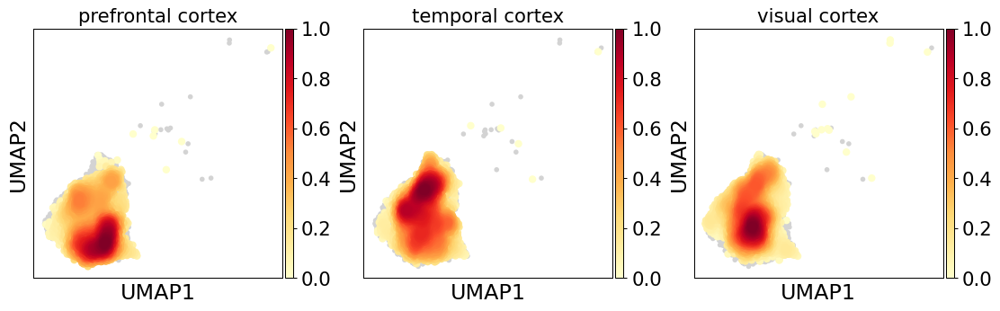

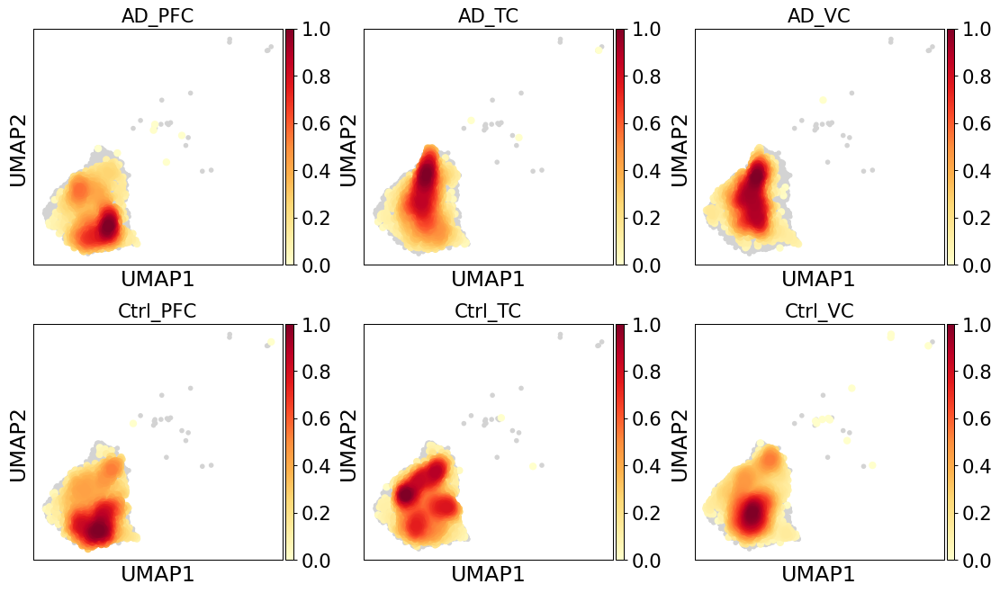

astro
computing density on 'umap'
computing density on 'umap'
computing density on 'umap'


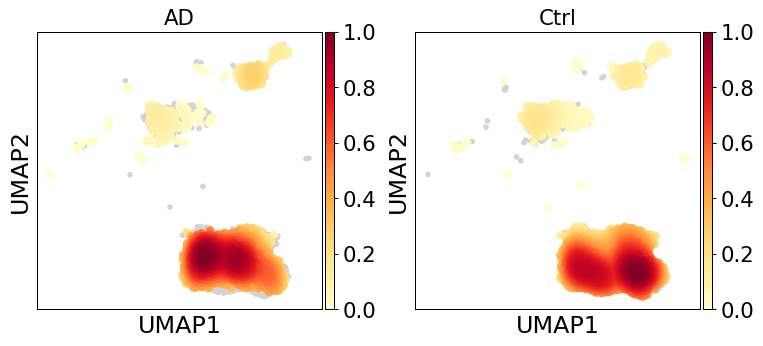

In [ ]:
for cell_type in np.unique(adata.obs['cell_type_sea']):
    if cell_type == 'VLMC': #not enough samples
        continue
    print(cell_type)
    adata_sub = adata[adata.obs['cell_type'] == cell_type]

    sc.tl.embedding_density(adata_sub, basis='umap', groupby='condition')
    sc.tl.embedding_density(adata_sub, basis='umap', groupby='area')
    sc.tl.embedding_density(adata_sub, basis='umap', groupby='condition_area')
    plt.rcParams["figure.figsize"] = (4, 4)
    sc.pl.embedding_density(adata_sub, basis='umap', key='umap_density_condition', save=f'_{cell_type}_condition_density.png')
    sc.pl.embedding_density(adata_sub, basis='umap', key='umap_density_area', save=f'_{cell_type}_area_density.png')
    sc.pl.embedding_density(adata_sub, basis='umap', key='umap_density_condition_area', ncols=3, save=f'_{cell_type}_area_density.png')